### This demo is from DETR official notebook and the HuggingFace version of it.

#### Install the required libraries

In [ ]:
!pip install -q git+https://github.com/huggingface/transformers.git timm

#### Prepare an image using DETRFeatureExtractor

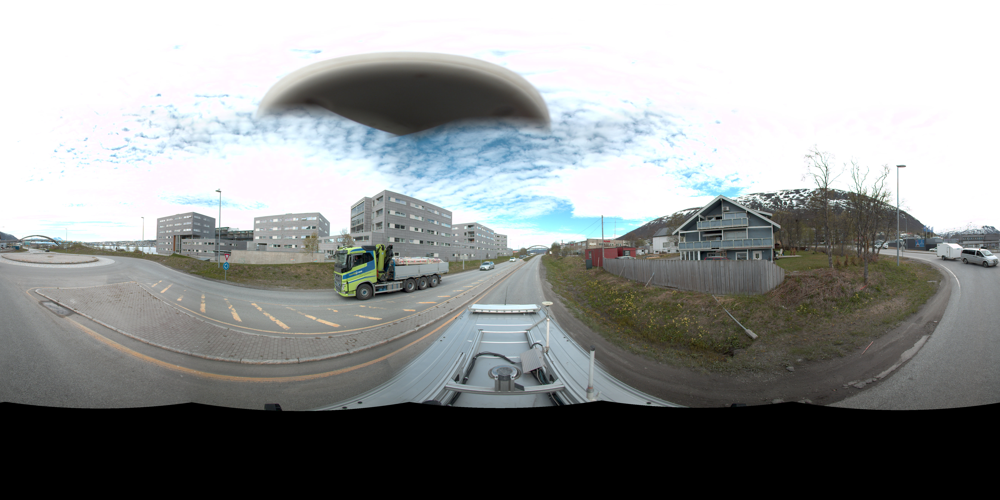

In [1]:
from PIL import Image
import requests
pm = "/storage/Projects/notebooks/detectron2/image10.jpg"
im = Image.open(pm)
im

#### Prepare the image of the model using DetrFeatureExtractor. It will take care of resizing the image + normalization across the channelsusing the ImageNet mean and standard deviation.

In [2]:
from transformers import DetrFeatureExtractor, DetrForSegmentation

feature_extractor = DetrFeatureExtractor.from_pretrained("facebook/detr-resnet-50-panoptic")

encoding = feature_extractor(im, return_tensors="pt")
encoding.keys()

dict_keys(['pixel_values', 'pixel_mask'])

In [3]:
encoding['pixel_values'].shape

torch.Size([1, 3, 666, 1332])

#### Forward Pass

In [4]:
from transformers import DetrForSegmentation

model = DetrForSegmentation.from_pretrained("facebook/detr-resnet-101-panoptic")

In [5]:
outputs = model(**encoding)

In [6]:
outputs.pred_masks.shape

torch.Size([1, 100, 167, 333])

In [15]:
target_sizes = torch.tensor([im.size[::-1]])
results = feature_extractor.post_process(outputs, target_sizes=target_sizes)[0]

#### Let's visualize the high confidence ones:

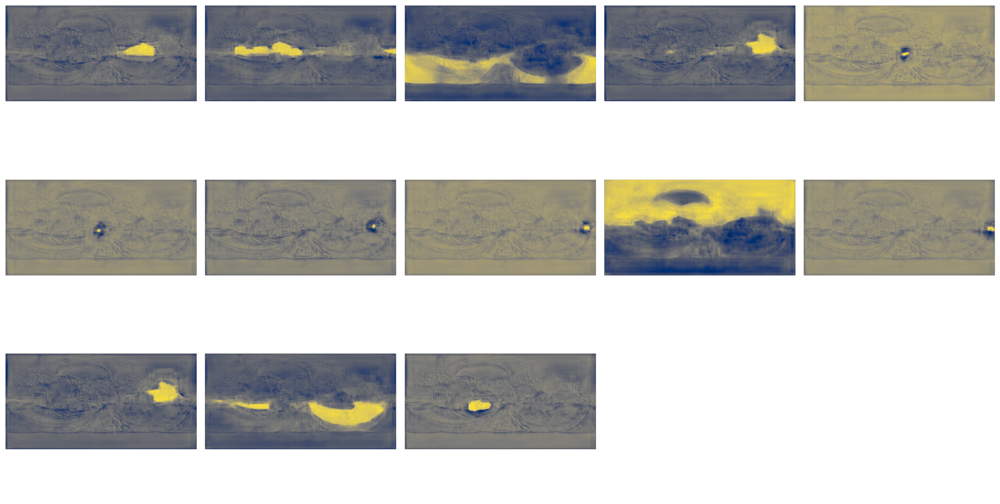

In [7]:
import matplotlib.pyplot as plt
%config InlineBackend.figure_format = 'retina'
import math

# compute the scores, excluding the "no-object" class (the last one)
scores = outputs.logits.softmax(-1)[..., :-1].max(-1)[0]
# threshold the confidence
keep = scores > 0.85

# Plot all the remaining masks
ncols = 5
fig, axs = plt.subplots(ncols=ncols, nrows=math.ceil(keep.sum().item() / ncols), figsize=(18, 10))
for line in axs:
    for a in line:
        a.axis('off')
for i, mask in enumerate(outputs.pred_masks[keep].detach().numpy()):
    ax = axs[i // ncols, i % ncols]
    ax.imshow(mask, cmap="cividis")
    ax.axis('off')
fig.tight_layout()

#### Merge the masks using a pixel-wise argmax, to obtain a unified panoptic segmentation of the image.

In [8]:
import torch

# use the post_process_panoptic method of DetrFeatureExtractor, which expects as input the target size of the predictions 
# (which we set here to the image size)
processed_sizes = torch.as_tensor(encoding['pixel_values'].shape[-2:]).unsqueeze(0)
result = feature_extractor.post_process_panoptic(outputs, processed_sizes)[0]

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:3635: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode)


#### Let's visualize the result

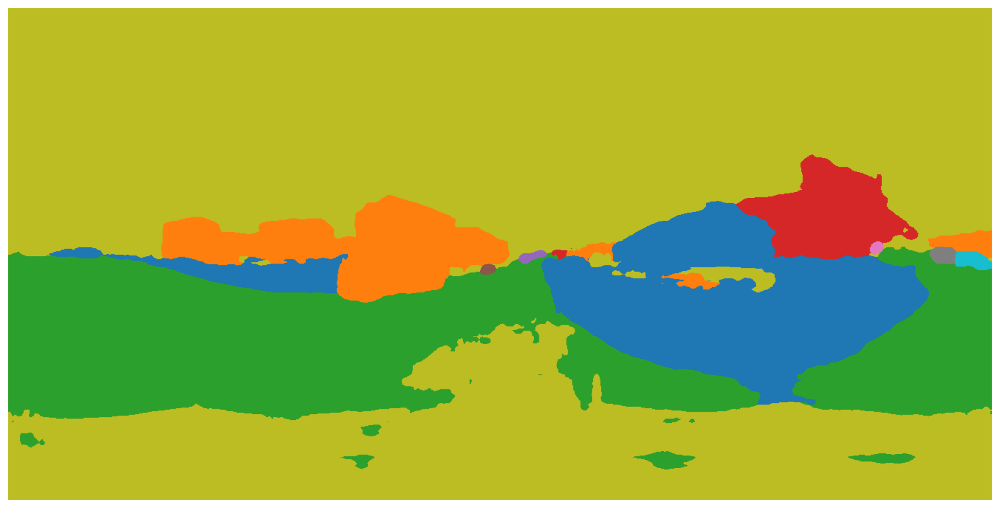

In [9]:
import itertools
import io
import seaborn as sns
import numpy 
from transformers.models.detr.feature_extraction_detr import rgb_to_id, id_to_rgb
palette = itertools.cycle(sns.color_palette())

panoptic_seg = Image.open(io.BytesIO(result['png_string']))
panoptic_seg = numpy.array(panoptic_seg, dtype=numpy.uint8).copy()

panoptic_seg_id = rgb_to_id(panoptic_seg)


panoptic_seg[:, :, :] = 0
for id in range(panoptic_seg_id.max() + 1):
  panoptic_seg[panoptic_seg_id == id] = numpy.asarray(next(palette)) * 255
plt.figure(figsize=(15,15))
plt.imshow(panoptic_seg)
plt.axis('off')
plt.show()

#### Visualization using Detectron2

In [10]:
%cd detectron2

/storage/Projects/notebooks/detectron2


In [11]:
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog


In [12]:
def cv2_imshow(img):
    img = img[:,:,[2,1,0]]
    img = Image.fromarray(img)
    plt.figure(figsize=(20, 20))
    plt.imshow(img)
    plt.axis('off')
    plt.show()

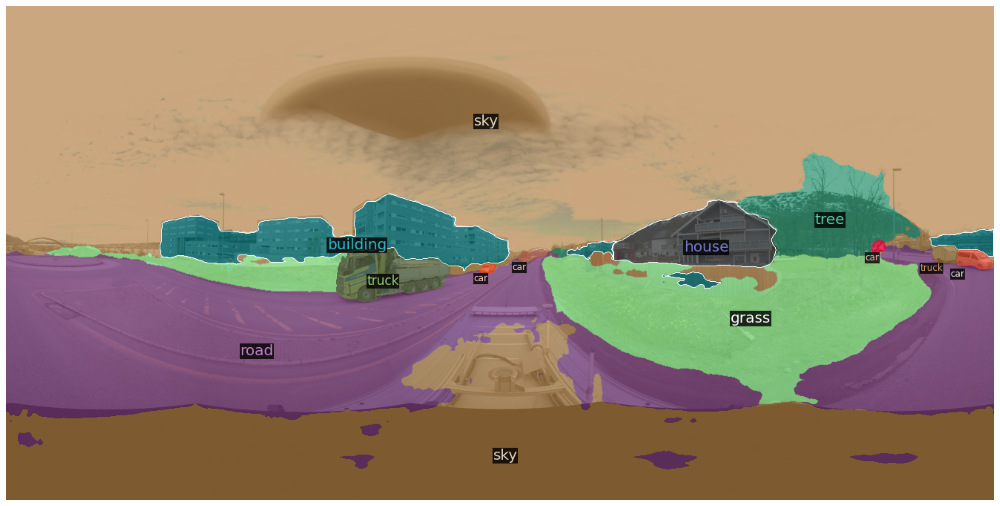

In [13]:
from copy import deepcopy
# We extract the segments info and the panoptic result from DETR's prediction
segments_info = deepcopy(result["segments_info"])
# Panoptic predictions are stored in a special format png
panoptic_seg = Image.open(io.BytesIO(result['png_string']))
final_w, final_h = panoptic_seg.size
# We convert the png into an segment id map
panoptic_seg = numpy.array(panoptic_seg, dtype=numpy.uint8)
panoptic_seg = torch.from_numpy(rgb_to_id(panoptic_seg))
    
# Detectron2 uses a different numbering of coco classes, here we convert the class ids accordingly
meta = MetadataCatalog.get("coco_2017_val_panoptic_separated")
for i in range(len(segments_info)):
    c = segments_info[i]["category_id"]
    segments_info[i]["category_id"] = meta.thing_dataset_id_to_contiguous_id[c] if segments_info[i]["isthing"] else meta.stuff_dataset_id_to_contiguous_id[c]

# Finally we visualize the prediction
v = Visualizer(numpy.array(im.copy().resize((final_w, final_h)))[:, :, ::-1], meta, scale=1.0)
v._default_font_size = 20
v = v.draw_panoptic_seg_predictions(panoptic_seg, segments_info, area_threshold=0)
cv2_imshow(v.get_image())

In [16]:
for score, label, box in zip(results["scores"], results["labels"], results["boxes"]):
    box = [round(i, 2) for i in box.tolist()]
    # let's only keep detections with score > 0.9
    if score > 0.9:
        print(
            f"Detected {model.config.id2label[label.item()]} with confidence "
            f"{round(score.item(), 3)} at location {box}"
        )
        

Detected house with confidence 0.961 at location [3364.1, 1055.56, 4279.16, 1405.45]
Detected LABEL_197 with confidence 0.937 at location [745.61, 1029.13, 5391.8, 1466.35]
Detected road with confidence 0.997 at location [4.23, 1269.96, 5396.44, 2258.17]
Detected car with confidence 0.99 at location [2590.22, 1400.66, 2669.75, 1447.04]
Detected car with confidence 0.909 at location [4725.76, 1288.81, 4817.16, 1334.34]
Detected truck with confidence 0.937 at location [5072.34, 1296.2, 5221.6, 1400.44]
Detected LABEL_187 with confidence 0.999 at location [4.01, 0.08, 5396.13, 1346.87]
Detected car with confidence 0.984 at location [5196.04, 1332.06, 5390.84, 1429.63]
Detected LABEL_193 with confidence 0.939 at location [83.72, 1281.65, 5119.15, 2062.36]
Detected truck with confidence 0.996 at location [1793.99, 1315.95, 2401.13, 1600.48]
